<a href="https://colab.research.google.com/github/makamkkumar/Maltego-Recorded_Future-TDS/blob/master/SatImage_Ships2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import json, sys, random
import numpy as np
from keras.models import Sequential 
from keras.layers import Dense, Flatten, Activation
from keras.layers import Dropout
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.utils import np_utils
from keras.optimizers import SGD
import keras.callbacks
from matplotlib import pyplot as plt
from google.colab import files
import zipfile
import io
from PIL import Image, ImageDraw

In [42]:
from google.colab import drive
#drive.mount('/content/drive')
!ls "/content/drive/My Drive/ships-in-satellite-imagery"
f = open('/content/drive/My Drive/ships-in-satellite-imagery/shipsnet.json')
dataset = json.load(f)
f.close()#! cd /ships-in-satellite-imagery


scenes	shipsnet  shipsnet.json


In [0]:
input_data = np.array(dataset['data']).astype('uint8')
output_data = np.array(dataset['labels']).astype('uint8')

In [44]:
input_data.shape

(4000, 19200)

In [45]:
input_data

array([[ 82,  89,  91, ...,  86,  88,  89],
       [ 76,  75,  67, ...,  54,  57,  58],
       [125, 127, 129, ..., 111, 109, 115],
       ...,
       [171, 135, 118, ...,  95,  95,  85],
       [ 85,  90,  94, ...,  96,  95,  89],
       [122, 122, 126, ...,  51,  46,  69]], dtype=uint8)

In [46]:
n_spectrum = 3 # color chanel RGB 
weight = 80
height = 80
X = input_data.reshape([-1, n_spectrum, weight, height])
X[0].shape

(3, 80, 80)

In [0]:
# get one channel 
pic = X[3]

red_spectrum = pic[0]
green_spectrum = pic[1]
blue_spectrum = pic[2] 

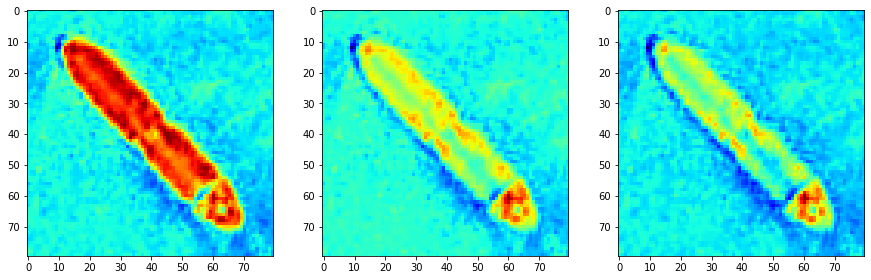

In [48]:
plt.figure(2, figsize = (5*3, 5*1))
plt.set_cmap('jet')

#show each channel
plt.subplot(1, 3, 1)
plt.imshow(red_spectrum)

plt.subplot(1, 3, 2)
plt.imshow(green_spectrum)

plt.subplot(1, 3, 3)
plt.imshow(blue_spectrum)

plt.show()

In [49]:
# just don`t get discouraged if some of the photos as X[0] might not have 3 bands RGB and you only get 1 color. 
# now let`s look at the output: which is a vector of lenght 4000 elements
output_data.shape

(4000,)

In [50]:
# the vector contains int 0 (no ship) and 1 (ship)
output_data

array([1, 1, 1, ..., 0, 0, 0], dtype=uint8)

In [51]:
np.bincount(output_data)

array([3000, 1000])

In [0]:
# Vector contains of 3000 zeros and 1000 units. 
# This means that in a dataset of 1000 images tagged with "ship" and 3000 images marked as "not ship".
# Preparing data
# We also need to categorically encode the labels:
# output encoding
y = np_utils.to_categorical(output_data, 2)

In [0]:
# shuffle all indexes
indexes = np.arange(4000)
np.random.shuffle(indexes)

In [0]:
X_train = X[indexes].transpose([0,2,3,1])
y_train = y[indexes]
# normalization 
X_train = X_train / 255 # images are type uint8 with values in the [0, 255] interval and we would like to contain values between 0 and 1


In [75]:
# Train the network
np.random.seed(42)
# network design
model = Sequential()

model.add(Conv2D(32, (3, 3), padding='same', input_shape=(80, 80, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #40x40
model.add(Dropout(0.25))

model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #20x20
model.add(Dropout(0.25))

model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #10x10
model.add(Dropout(0.25))

model.add(Conv2D(32, (10, 10), padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #5x5
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))

model.add(Dense(2, activation='softmax'))

# One has to understand relu and softmax / dropout 

# optimization setup
sgd = SGD(lr=0.01, momentum=0.9, nesterov=True)
model.compile(
    loss='categorical_crossentropy',
    optimizer=sgd,
    metrics=['accuracy'])

# training
model.fit(
    X_train, 
    y_train,
    batch_size=32,
    epochs=25,
    validation_split=0.2,
    shuffle=True,
    verbose=2)

Train on 3200 samples, validate on 800 samples
Epoch 1/25
 - 38s - loss: 0.4467 - acc: 0.8063 - val_loss: 0.2871 - val_acc: 0.8938
Epoch 2/25
 - 38s - loss: 0.2455 - acc: 0.8972 - val_loss: 0.1892 - val_acc: 0.9425
Epoch 3/25
 - 37s - loss: 0.1933 - acc: 0.9219 - val_loss: 0.1290 - val_acc: 0.9613
Epoch 4/25
 - 37s - loss: 0.1538 - acc: 0.9356 - val_loss: 0.1227 - val_acc: 0.9487
Epoch 5/25
 - 37s - loss: 0.1494 - acc: 0.9384 - val_loss: 0.0762 - val_acc: 0.9712
Epoch 6/25
 - 37s - loss: 0.1154 - acc: 0.9575 - val_loss: 0.1215 - val_acc: 0.9663
Epoch 7/25
 - 37s - loss: 0.1040 - acc: 0.9647 - val_loss: 0.0668 - val_acc: 0.9775
Epoch 8/25
 - 37s - loss: 0.0895 - acc: 0.9688 - val_loss: 0.0652 - val_acc: 0.9775
Epoch 9/25
 - 38s - loss: 0.0787 - acc: 0.9703 - val_loss: 0.0540 - val_acc: 0.9862
Epoch 10/25
 - 38s - loss: 0.0660 - acc: 0.9756 - val_loss: 0.0498 - val_acc: 0.9838
Epoch 11/25
 - 37s - loss: 0.0763 - acc: 0.9759 - val_loss: 0.0551 - val_acc: 0.9825
Epoch 12/25
 - 37s - loss: 

In [0]:
model.save('/content/drive/My Drive/keras.h5')
model_save_name = 'shipclassifier.pt'
path = F"/content/drive/My Drive/{model_save_name}" 
model.save(path)
#torch.save(model.state_dict(), path)
#model_json = model.to_json()
#model_json = model.fit()
#with open("model1.json","w") as json_file:
#     json_file.write(model_jason)
#files.download("model1.json")
#model.save('weights.h5')
#files.download('weights.h5')

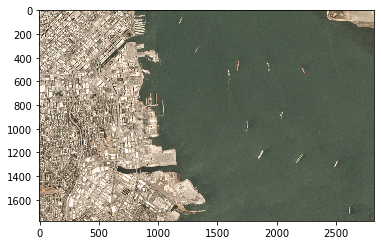

In [91]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/sfbay_1.png')
pix = image.load()
plt.imshow(image)

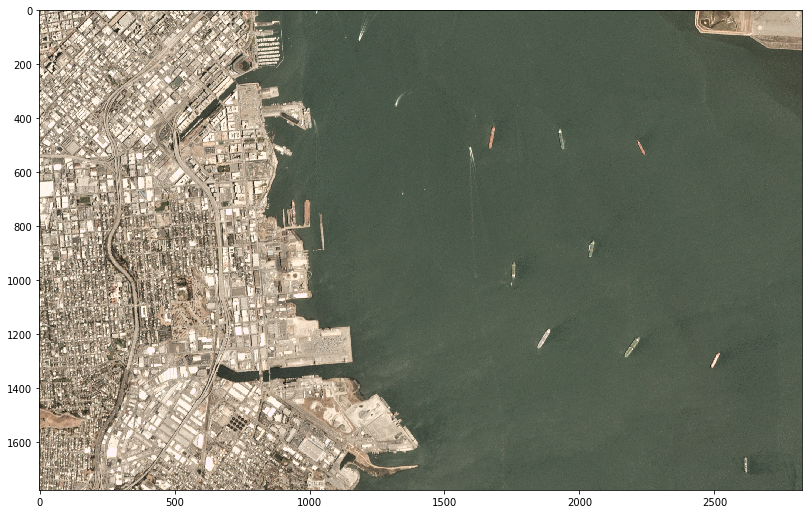

In [92]:
n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()


In [0]:
picture_tensor = picture_tensor.transpose(2,0,1)

X:810 Y:10  [[0.00154154 0.9984585 ]]


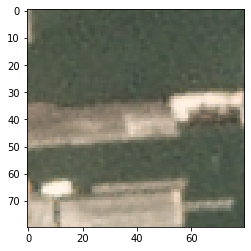

X:1120 Y:60  [[0.05971656 0.9402834 ]]


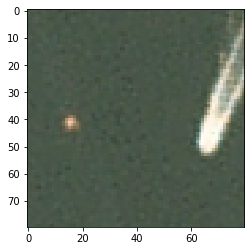

X:1640 Y:420  [[0.03800616 0.96199393]]


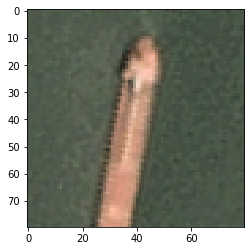

X:1890 Y:430  [[0.01933441 0.9806656 ]]


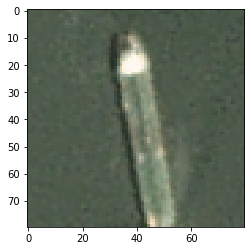

X:2190 Y:470  [[0.0029471 0.9970529]]


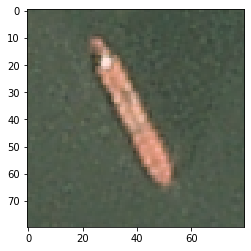

X:930 Y:760  [[0.06291259 0.9370874 ]]


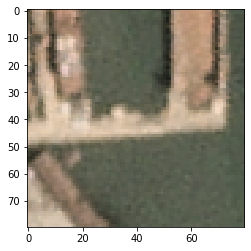

X:980 Y:850  [[0.02417717 0.9758228 ]]


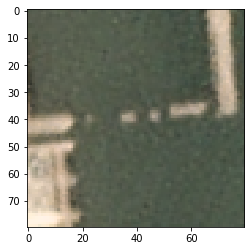

X:2000 Y:850  [[0.07488429 0.9251157 ]]


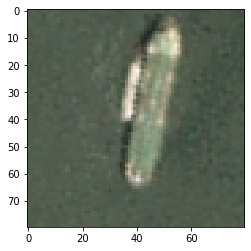

X:1830 Y:1170  [[0.02468078 0.97531927]]


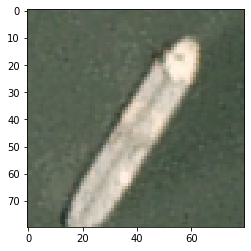

X:2160 Y:1200  [[0.00508587 0.9949142 ]]


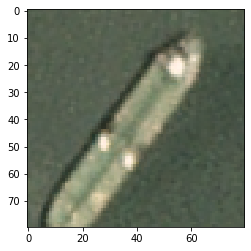

X:2460 Y:1260  [[0.0031371 0.9968629]]


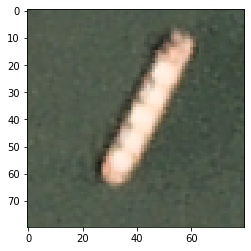

X:910 Y:1330  [[0.00928108 0.9907189 ]]


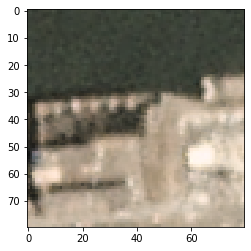

X:1200 Y:1650  [[0.04972195 0.95027804]]


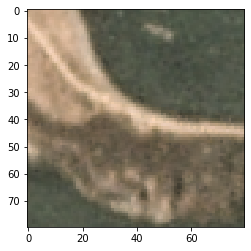

X:1290 Y:1650  [[2.7068864e-04 9.9972934e-01]]


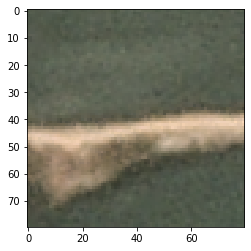

X:2740 Y:1690  

In [94]:
# Searching on the image
def cutting(x, y):
    area_study = np.arange(3*80*80).reshape(3, 80, 80)
    for i in range(80):
        for j in range(80):
            area_study[0][i][j] = picture_tensor[0][y+i][x+j]
            area_study[1][i][j] = picture_tensor[1][y+i][x+j]
            area_study[2][i][j] = picture_tensor[2][y+i][x+j]
    area_study = area_study.reshape([-1, 3, 80, 80])
    area_study = area_study.transpose([0,2,3,1])
    area_study = area_study / 255
    sys.stdout.write('\rX:{0} Y:{1}  '.format(x, y))
    return area_study

def not_near(x, y, s, coordinates):
    result = True
    for e in coordinates:
        if x+s > e[0][0] and x-s < e[0][0] and y+s > e[0][1] and y-s < e[0][1]:
            result = False
    return result

def show_ship(x, y, acc, thickness=5):   
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picture_tensor[ch][y+i][x-th] = -1

    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picture_tensor[ch][y+i][x+th+80] = -1
        
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picture_tensor[ch][y-th][x+i] = -1
        
    for i in range(80):
        for ch in range(3):
            for th in range(thickness):
                picture_tensor[ch][y+th+80][x+i] = -1

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

In [0]:
# ! pip install tensorflowjs 
modelpath='/content/drive/My Drive/ShipClassifier/'
#!pip install tensorflowjs 
!tensorflowjs_converter --input_format keras keras2.h5 modelpath

In [0]:
# For a better understanding, boxing and tagging the findings on the image. 
for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

In [96]:
#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

(1777, 2825, 3)

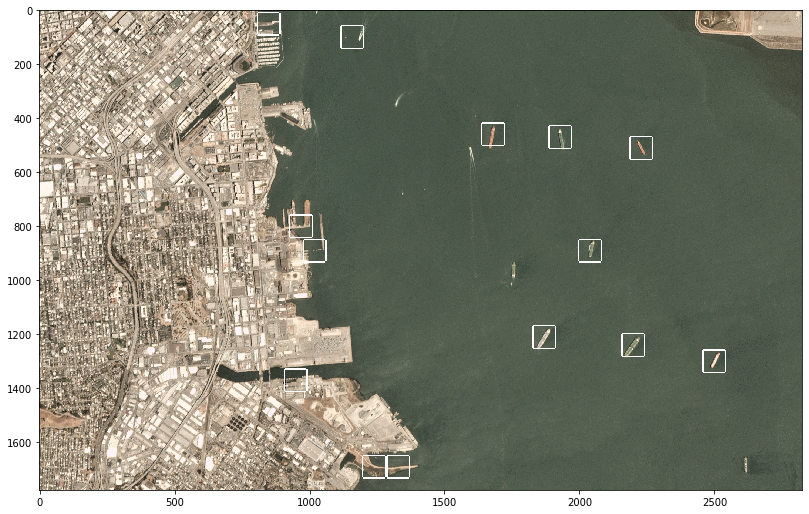

In [97]:
plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

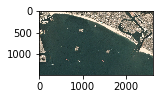

X:210 Y:240  [[0.01899619 0.9810038 ]]


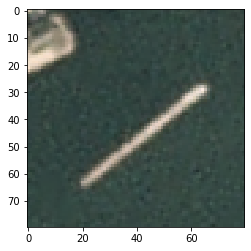

X:1020 Y:400  [[0.04639494 0.95360506]]


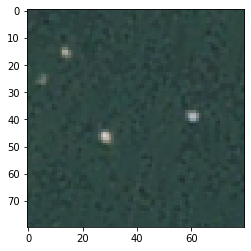

X:140 Y:880  [[0.00242465 0.99757534]]


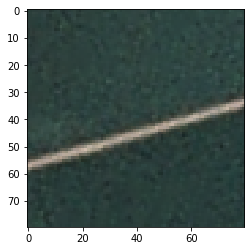

X:140 Y:1060  [[3.4854442e-04 9.9965143e-01]]


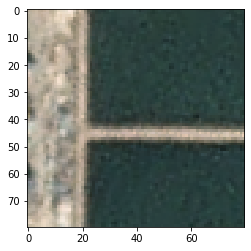

X:600 Y:1080  [[2.3111654e-04 9.9976891e-01]]


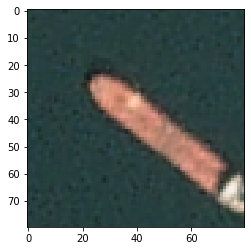

X:870 Y:1110  [[4.226855e-06 9.999958e-01]]


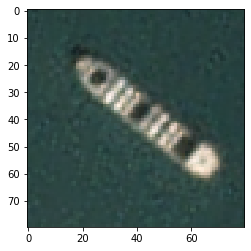

X:1430 Y:1110  [[3.0365212e-05 9.9996960e-01]]


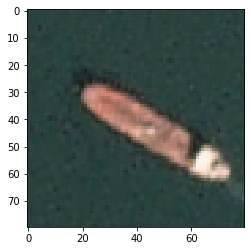

X:270 Y:1190  [[0.01020871 0.98979133]]


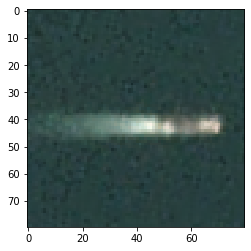

X:2540 Y:1390  

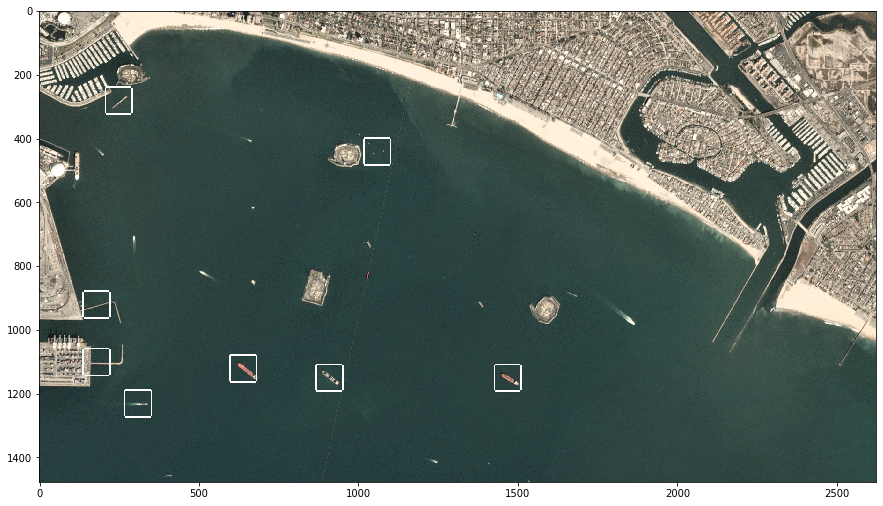

In [98]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/lb_4.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

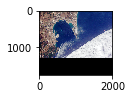

X:770 Y:370  [[0.07550097 0.924499  ]]


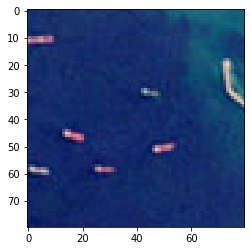

X:1210 Y:380  [[0.01018312 0.9898169 ]]


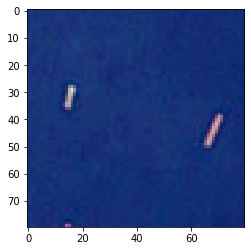

X:520 Y:390  [[9.518707e-04 9.990482e-01]]


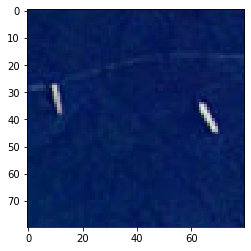

X:410 Y:410  [[0.02118653 0.9788135 ]]


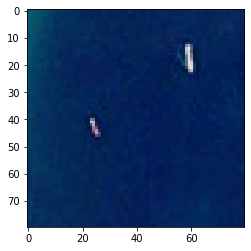

X:810 Y:510  [[0.01630122 0.9836987 ]]


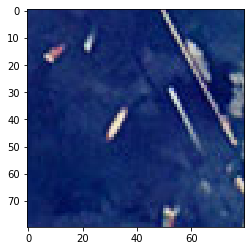

X:770 Y:640  [[1.12644106e-04 9.99887347e-01]]


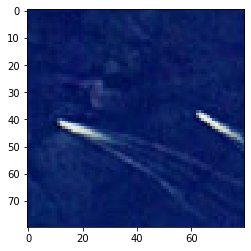

X:360 Y:1200  [[0.00122327 0.99877673]]


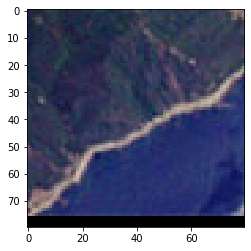

X:710 Y:1230  [[0.06358001 0.93642   ]]


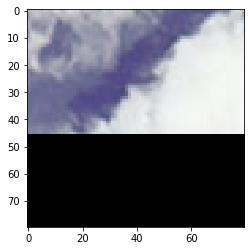

X:800 Y:1230  [[0.06907486 0.93092513]]


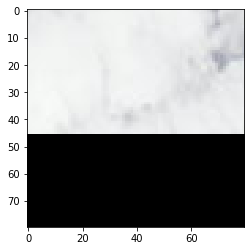

X:890 Y:1230  [[0.09857005 0.90142995]]


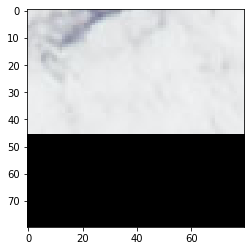

X:1030 Y:1230  [[0.09475853 0.90524143]]


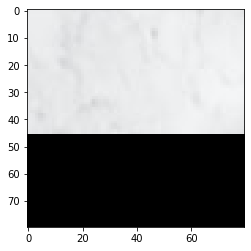

X:1230 Y:1230  [[0.0965287 0.9034713]]


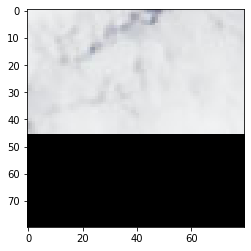

X:1320 Y:1230  [[0.05268117 0.94731885]]


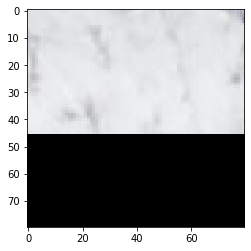

X:1920 Y:1660  

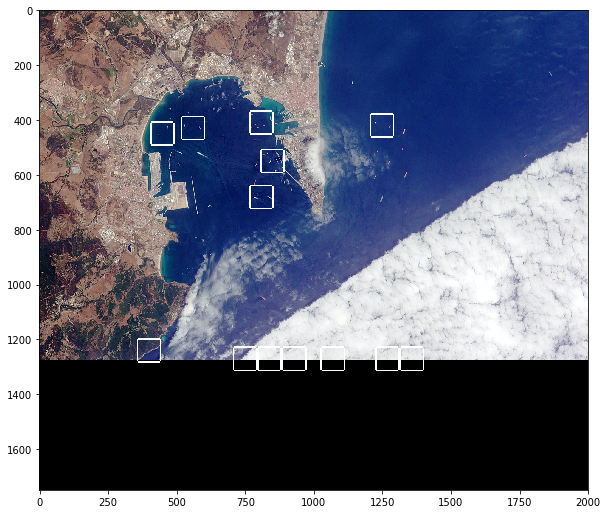

In [99]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Gibralter_modified.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

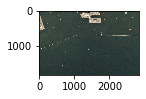

X:1770 Y:30  [[0.04841973 0.9515802 ]]


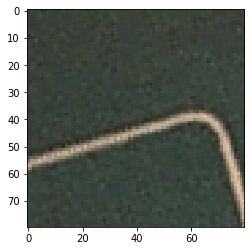

X:2170 Y:190  [[0.01160868 0.98839134]]


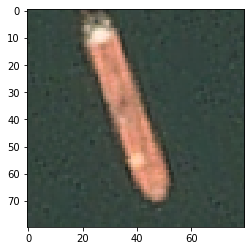

X:2420 Y:200  [[9.215978e-04 9.990784e-01]]


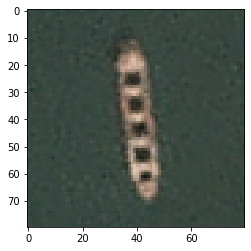

X:1740 Y:220  [[7.0100391e-06 9.9999297e-01]]


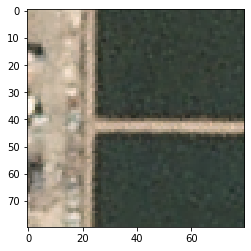

X:1100 Y:400  [[1.2329414e-04 9.9987674e-01]]


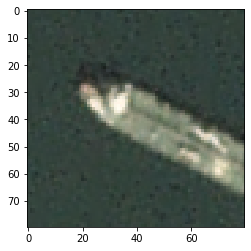

X:360 Y:430  [[0.00558587 0.9944141 ]]


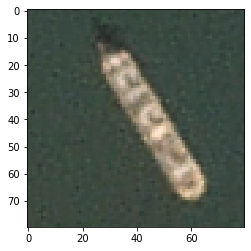

X:1560 Y:470  [[0.02173679 0.9782632 ]]


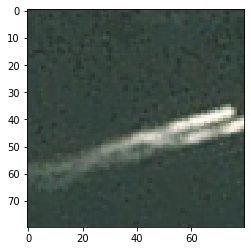

X:2520 Y:490  [[0.01311256 0.9868874 ]]


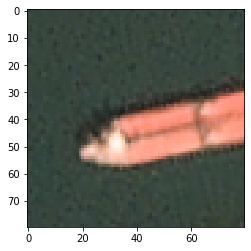

X:1070 Y:640  [[0.0010654  0.99893457]]


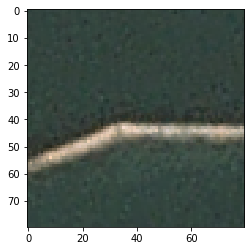

X:1160 Y:640  [[4.5441313e-05 9.9995458e-01]]


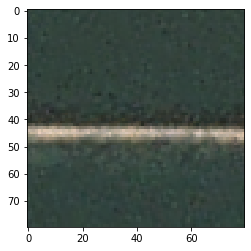

X:1250 Y:640  [[0.00906304 0.99093693]]


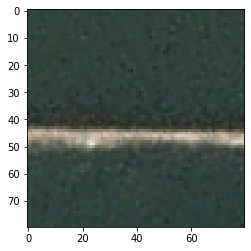

X:1340 Y:650  [[1.0972088e-05 9.9998903e-01]]


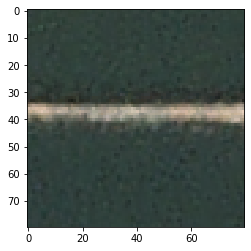

X:1430 Y:650  [[3.6957522e-07 9.9999964e-01]]


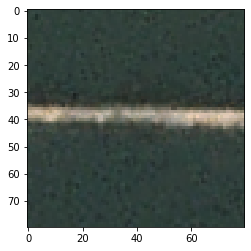

X:1520 Y:650  [[6.317008e-06 9.999937e-01]]


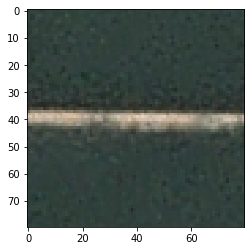

X:1610 Y:650  [[2.3277682e-06 9.9999762e-01]]


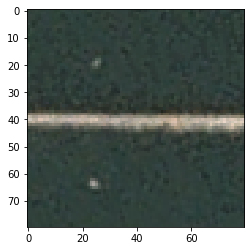

X:1870 Y:650  [[2.6304089e-04 9.9973696e-01]]


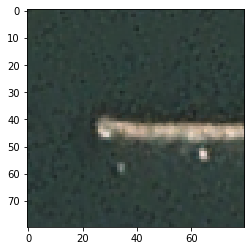

X:1960 Y:650  [[7.4267940e-04 9.9925727e-01]]


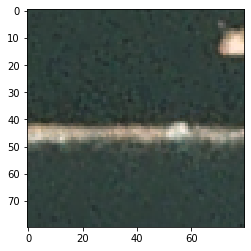

X:2050 Y:650  [[0.01285006 0.98714995]]


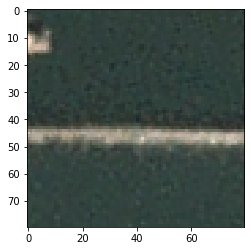

X:2140 Y:660  [[8.803941e-05 9.999119e-01]]


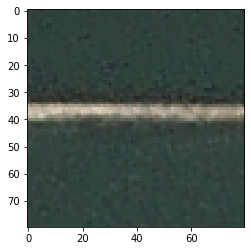

X:2230 Y:660  [[1.865077e-05 9.999814e-01]]


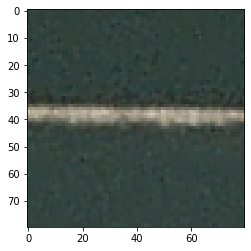

X:2320 Y:660  [[9.5074975e-06 9.9999046e-01]]


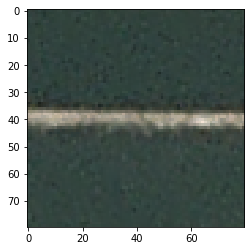

X:2410 Y:660  [[6.086527e-07 9.999994e-01]]


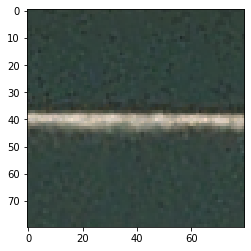

X:2500 Y:660  [[1.175568e-06 9.999988e-01]]


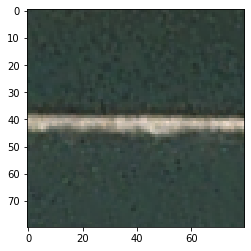

X:2590 Y:660  [[2.2687199e-07 9.9999976e-01]]


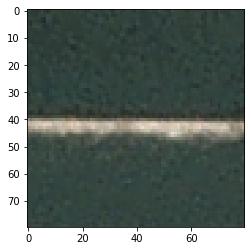

X:2680 Y:660  [[3.4436900e-07 9.9999964e-01]]


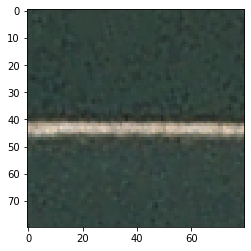

X:980 Y:670  [[1.5950791e-04 9.9984050e-01]]


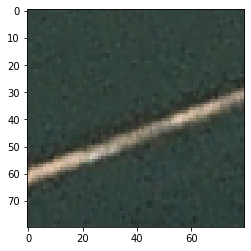

X:380 Y:680  [[0.00229038 0.99770963]]


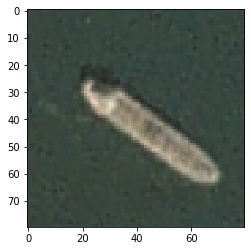

X:870 Y:710  [[0.00962524 0.99037474]]


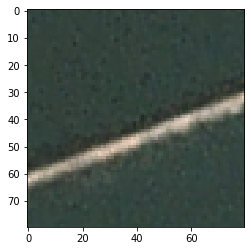

X:770 Y:750  [[3.2673343e-05 9.9996734e-01]]


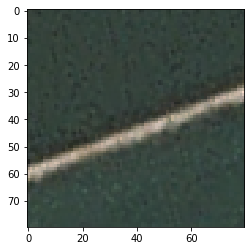

X:660 Y:790  [[1.2943505e-04 9.9987054e-01]]


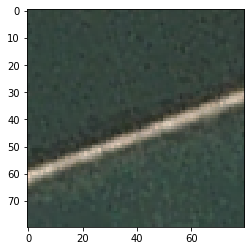

X:550 Y:830  [[0.00103387 0.9989661 ]]


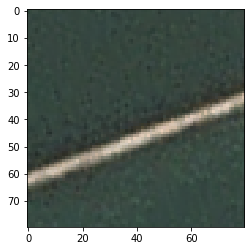

X:440 Y:870  [[0.01050736 0.98949265]]


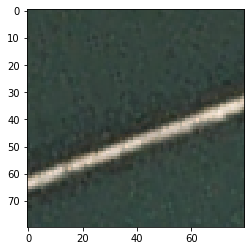

X:340 Y:910  [[8.874308e-06 9.999912e-01]]


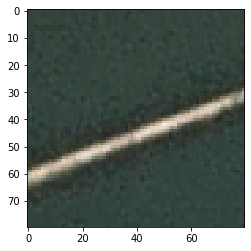

X:230 Y:950  [[0.00765489 0.99234515]]


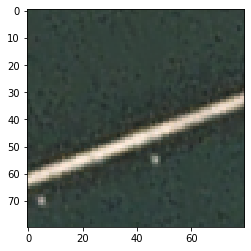

X:120 Y:990  [[0.03428766 0.9657123 ]]


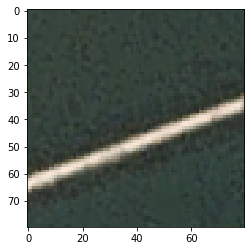

X:20 Y:1030  [[5.501798e-07 9.999994e-01]]


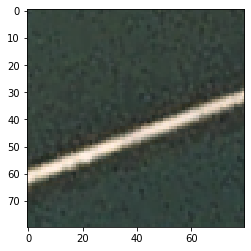

X:1370 Y:1060  [[0.08387063 0.91612935]]


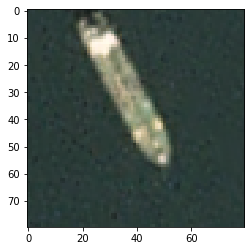

X:680 Y:1120  [[0.00181316 0.9981869 ]]


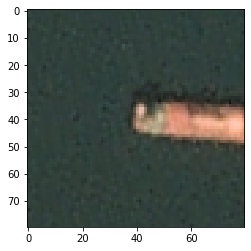

X:640 Y:1500  [[0.01079867 0.9892013 ]]


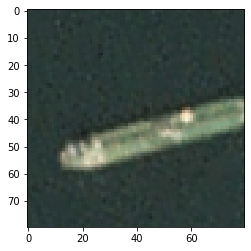

X:2760 Y:1740  

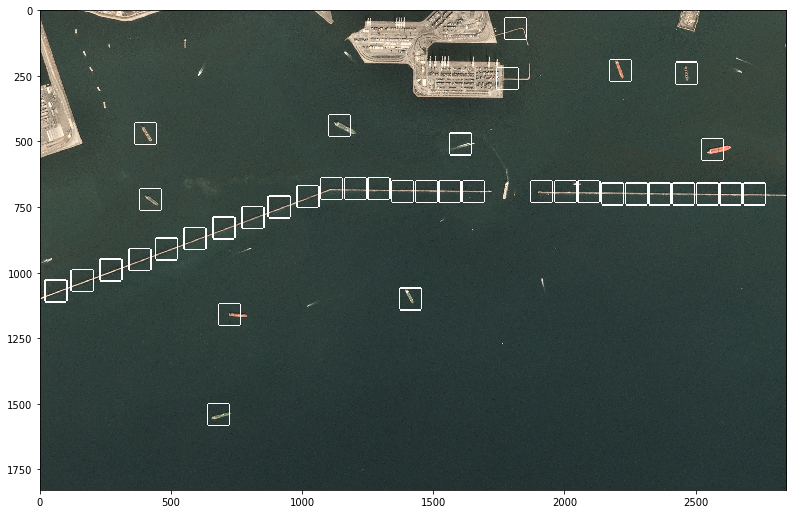

In [101]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/lb_2.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

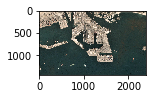

X:1700 Y:210  [[0.00130147 0.9986985 ]]


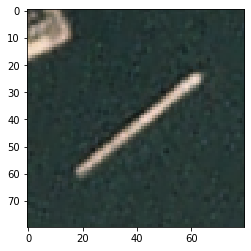

X:1360 Y:330  [[0.05476391 0.9452361 ]]


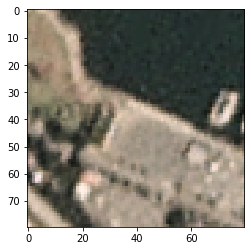

X:730 Y:360  [[0.02145858 0.97854143]]


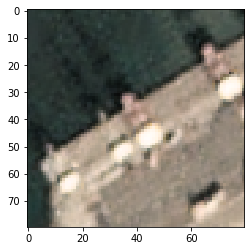

X:780 Y:590  [[0.01740599 0.98259395]]


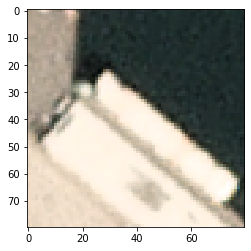

X:0 Y:650  [[0.02120434 0.9787957 ]]


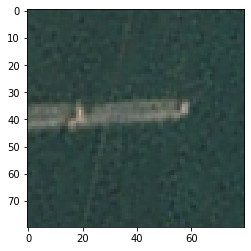

X:480 Y:660  [[0.01068541 0.98931456]]


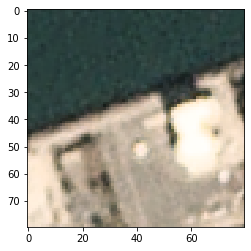

X:590 Y:660  [[0.01175795 0.9882421 ]]


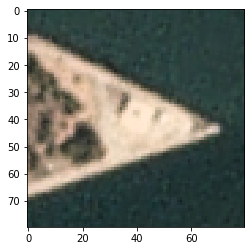

X:870 Y:660  [[0.00209807 0.9979019 ]]


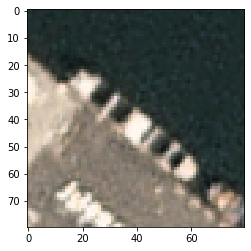

X:1180 Y:800  [[0.00493188 0.9950681 ]]


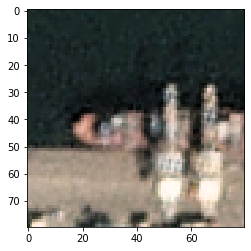

X:1290 Y:810  [[0.0351097  0.96489036]]


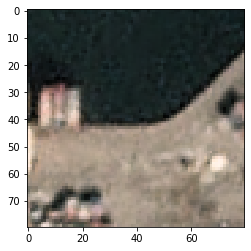

X:1650 Y:840  [[6.6495215e-04 9.9933499e-01]]


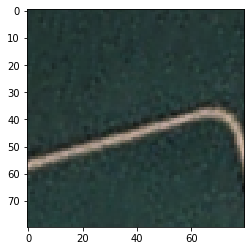

X:580 Y:930  [[0.01449615 0.98550385]]


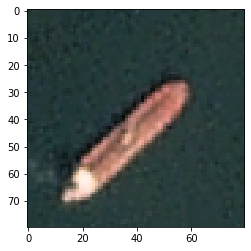

X:1490 Y:960  [[0.01887571 0.98112434]]


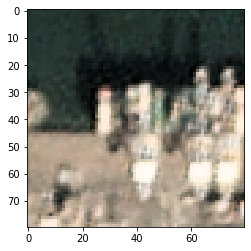

X:1630 Y:1030  [[4.9956292e-05 9.9995005e-01]]


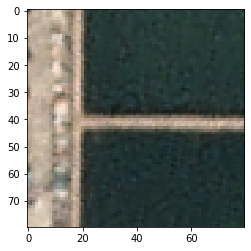

X:110 Y:1060  [[0.04794512 0.9520549 ]]


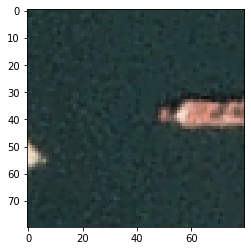

X:2060 Y:1060  [[0.01783368 0.98216635]]


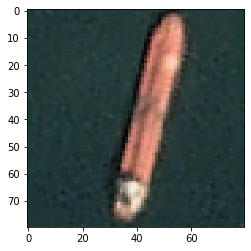

X:700 Y:1160  [[0.0193441 0.9806559]]


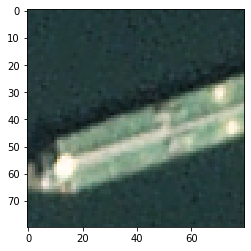

X:470 Y:1170  [[0.02787444 0.9721256 ]]


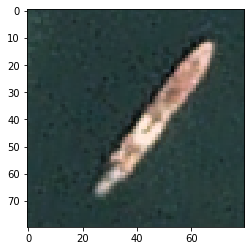

X:230 Y:1240  [[0.05330397 0.946696  ]]


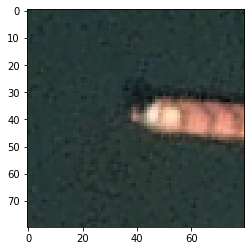

X:2310 Y:1350  

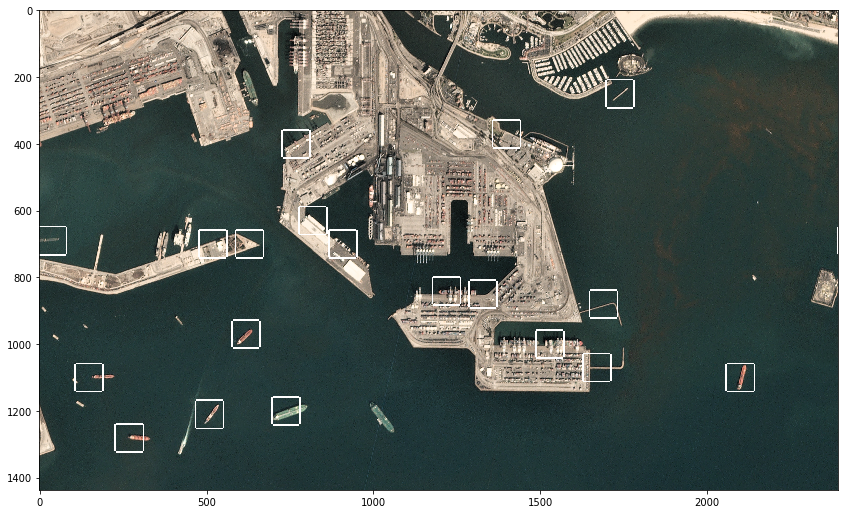

In [103]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/lb_3.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

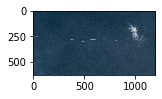

X:1070 Y:230  [[0.09639737 0.90360266]]


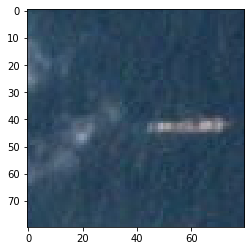

X:540 Y:240  [[0.02348329 0.9765168 ]]


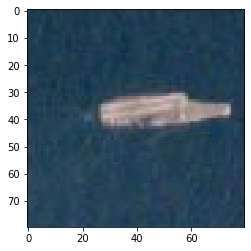

X:1120 Y:540  

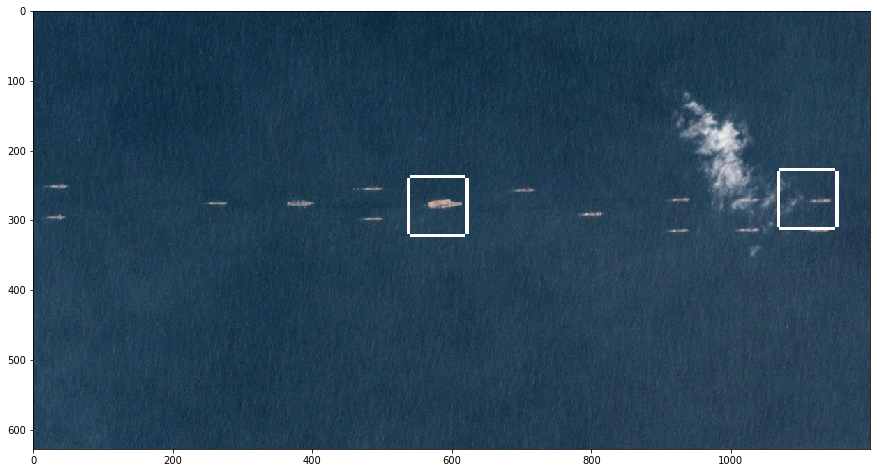

In [106]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Chinese_fleet.jpg')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

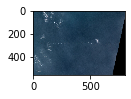

X:160 Y:70  [[0.02816638 0.9718336 ]]


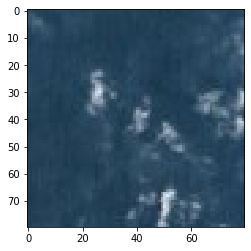

X:660 Y:250  [[0.04836512 0.9516349 ]]


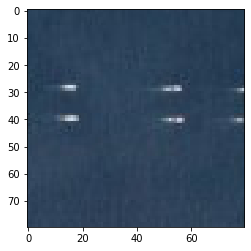

X:720 Y:470  

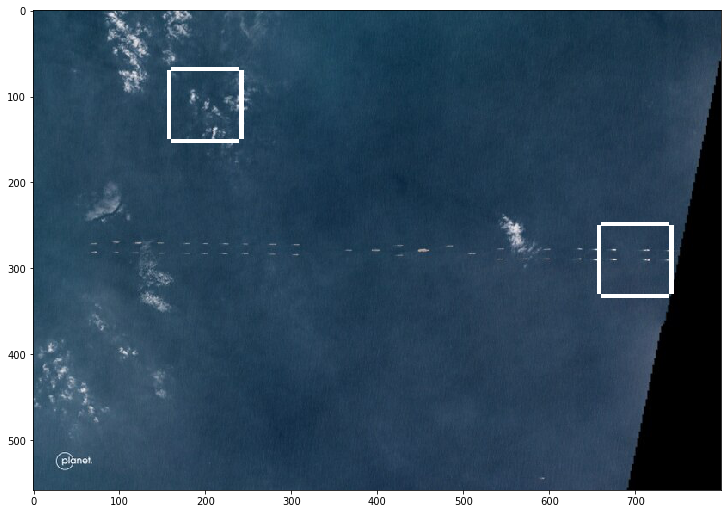

In [108]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Chinese_fleet2.jpg')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

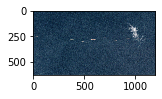

X:1060 Y:230  [[0.0543695  0.94563055]]


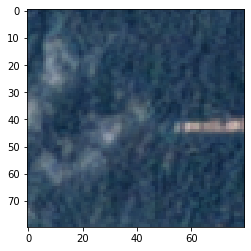

X:530 Y:240  [[0.07801361 0.92198634]]


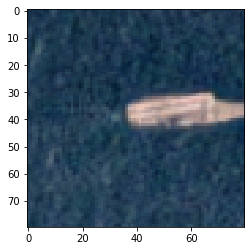

X:1120 Y:540  

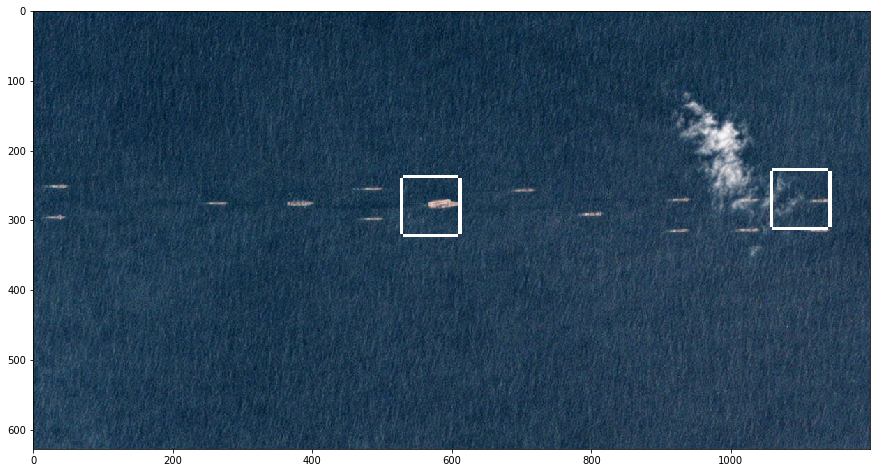

In [111]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Chinese_fleet_enhanced_textures_supreme.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

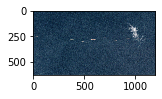

X:545 Y:230  [[0.02394249 0.97605747]]


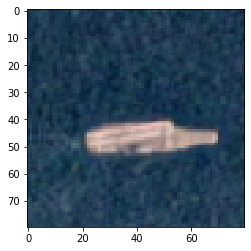

X:1060 Y:230  [[0.0543695  0.94563055]]


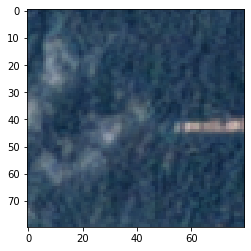

X:330 Y:235  [[0.07218858 0.9278114 ]]


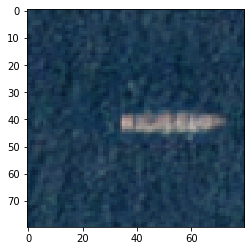

X:1120 Y:545  

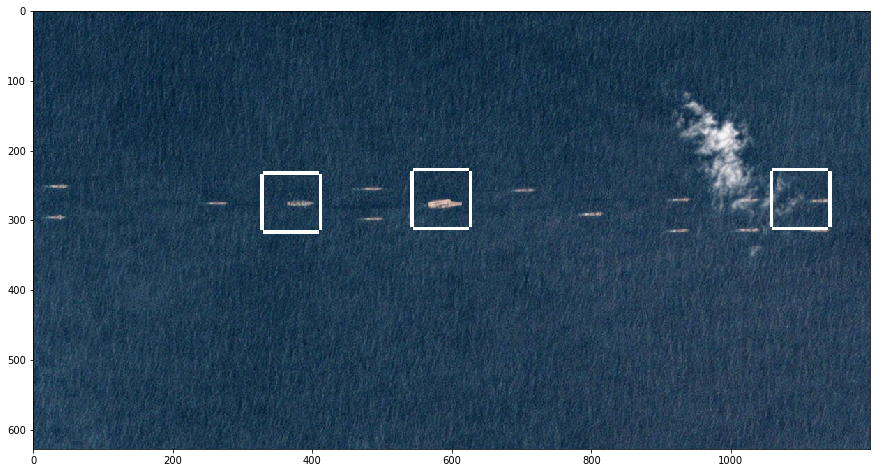

In [113]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Chinese_fleet_enhanced_textures_supreme.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()
mat_size = 80
picture_tensor = picture_tensor.transpose(2,0,1)

step = 5; coordinates = []
for y in range(int((height-(mat_size-step))/step)):
    for x in range(int((width-(mat_size-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()

In [0]:
# to explain: categorical_crossentropy maybe explain 'accuracy' as well the Loss Function
# batch size = 32 photos at once 
# Using Network
from PIL import Image, ImageDraw
# download image
#image_name = 'lb_1.png'
image = Image.open('/content/drive/My Drive//ships-in-satellite-imagery/scenes/scenes/Chinese_fleet2_enhanced_textures_supreme.png')
pix = image.load()
plt.imshow(image)

n_spectrum = 3
width = image.size[0]
height = image.size[1]

# creating vector
picture_vector = []
for chanel in range(n_spectrum):
    for y in range(height):
        for x in range(width):
            picture_vector.append(pix[x, y][chanel])

picture_vector = np.array(picture_vector).astype('uint8')
picture_tensor = picture_vector.reshape([n_spectrum, height, width]).transpose(1, 2, 0)

plt.figure(1, figsize = (15, 30))

plt.subplot(3, 1, 1)
plt.imshow(picture_tensor)

plt.show()

picture_tensor = picture_tensor.transpose(2,0,1)

step = 10; coordinates = []
for y in range(int((height-(80-step))/step)):
    for x in range(int((width-(80-step))/step) ):
        area = cutting(x*step, y*step)
        result = model.predict(area)
        if result[0][1] > 0.90 and not_near(x*step,y*step, 88, coordinates):
            coordinates.append([[x*step, y*step], result])
            print(result)
            plt.imshow(area[0])
            plt.show()

for e in coordinates:
    show_ship(e[0][0], e[0][1], e[1][0][1])

#picture_tensor = picture_tensor.transpose(2,0,1)
picture_tensor = picture_tensor.transpose(1,2,0)
picture_tensor.shape

plt.figure(1, figsize = (15, 30))

plt.subplot(3,1,1)
plt.imshow(picture_tensor)

plt.show()